# Part 1

In [1]:
#A
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
#B
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
#C
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
#D
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
#E
from sklearn.pipeline import Pipeline
from sklearn.kernel_ridge import KernelRidge

# Part 1 A)

C:\Users\ahmed\anaconda3\Lib\site-packages\sklearn\impute\_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


CO(GT)           1.000000
C6H6(GT)         0.931078
PT08.S2(NMHC)    0.915514
PT08.S1(CO)      0.879288
PT08.S5(O3)      0.854182
NOx(GT)          0.795028
NO2(GT)          0.683343
PT08.S4(NO2)     0.630703
RH               0.048890
AH               0.048556
T                0.022109
PT08.S3(NOx)    -0.703446
Name: CO(GT), dtype: float64


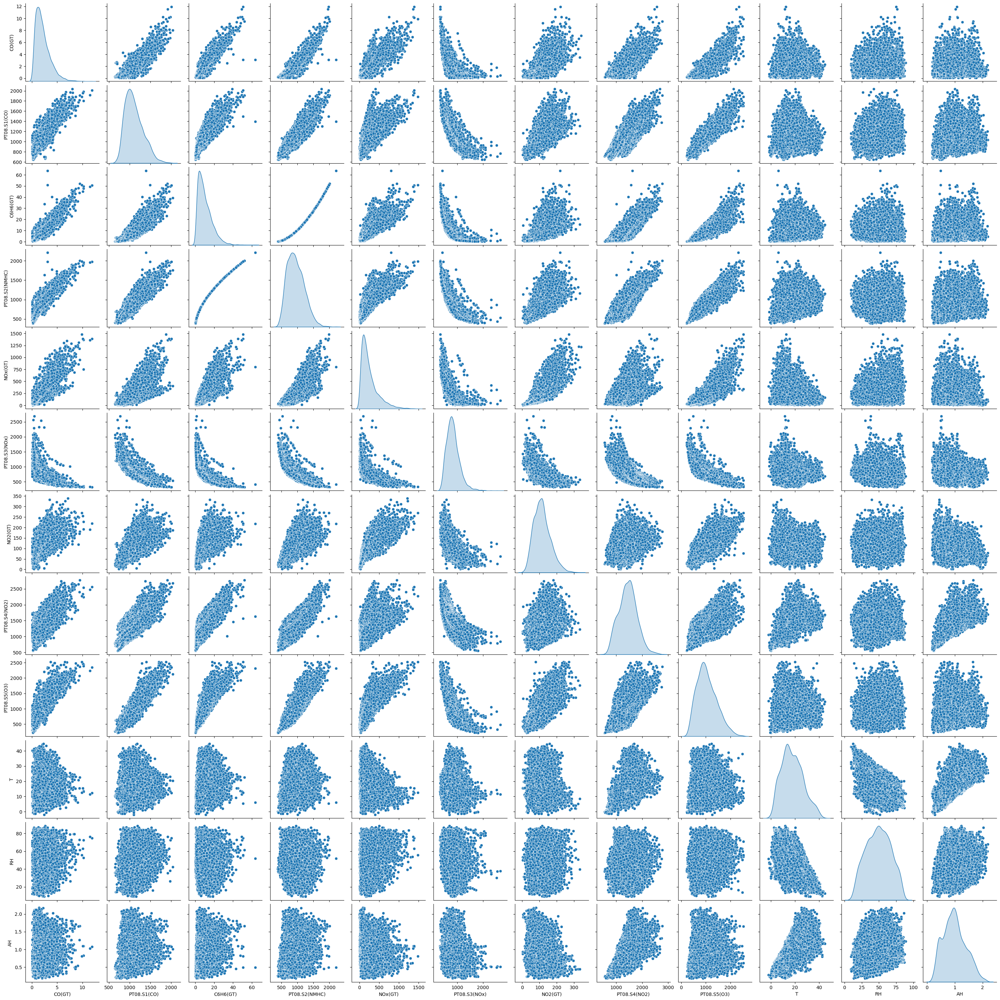

In [2]:

#A
df_q1 = pd.read_csv("q1.csv")
sns.pairplot(data=df_q1, diag_kind="kde")

# Raw data before imputation
X = df_q1.drop(columns=["CO(GT)"])
y = df_q1["CO(GT)"]

missing_valuesX = X.isnull().sum()


# Data after imputing
imputer = IterativeImputer(max_iter=100, random_state=0)
imputed_values = imputer.fit_transform(X)
imputed_values = pd.DataFrame(imputed_values, columns = X.columns, index = X.index) # since imputing returns a numpy array
#Fully imputed Dataframe
imputed_values.insert(0, "CO(GT)", y)
df_q1_imputed = imputed_values
X_imputed = df_q1_imputed.drop(columns=["CO(GT)"])
# Quick correlations with target
corr = df_q1.corr(numeric_only=True)["CO(GT)"].sort_values(ascending=False)
print(corr)

In [3]:
corr_df1_imputed = df_q1_imputed.corr(numeric_only=True)["CO(GT)"].sort_values(ascending=False)
print(corr_df1_imputed)

CO(GT)           1.000000
C6H6(GT)         0.929441
PT08.S2(NMHC)    0.914532
PT08.S1(CO)      0.880501
PT08.S5(O3)      0.857703
NOx(GT)          0.797132
NO2(GT)          0.693271
PT08.S4(NO2)     0.623087
RH               0.065739
AH               0.033653
T               -0.002296
PT08.S3(NOx)    -0.713140
Name: CO(GT), dtype: float64


Initial shape of features with missing values:
shape = (7674, 11)
Total number of missing values from all features = 3799
Missing values per feature: On average, 345 missing values per feature with 33 standard deviations from the mean for each feature. 

Given that the missing values represent 50% of the data, data deletion would be a bad approach, resulting in the following:
•	Worse generalization
•	Weaker statistical power
•	Higher variance in model estimates
•	Unstable model training
The model would then learn a distorted version of reality, making predictions of CO unreliable under real-world conditions. 

Many of the missing indexes might be the SAME rows, since air quality sensors fail at the same timestamp.  To make sure of that, the missing values are dropped. 
The new shape of the data frame after dropping the missing values is:
Shape = (6941, 12)

This translates to only 10% of the data being dropped, meaning that some missing values overlap. However, dropping 10% if the data is still not recommended. Hence, Iterative Imputing is chosen for filling missing values by modeling each feature as a function of all other features, preserving the relationship with all other variables, respecting correlations and making realistic imputations. This works by fitting a model using the complete feature rows to predict the missing value. Uses the missing value as the target and other features as predictors. 

Within Iterative Imputing, a Bayesian Ridge estimator is used given relationship between features is mostly linear. Bayesian Ridge benefits from this as it uses relationships between features to predict/estimate missing ones. Hence, given strong relationship presence, this allows Bayesian Ridge to work well. Describing the X values before and after imputation, their std has been reduced. 


Regarding faulty readings, given the following sensory range, if an unrealistic value is presented out of sensor range (flagged as an outlier), it is detected as faulty and should be brought back to its range. To fix this, we create a dictionary with all sensors and their ranges. Then use a for loop and check whether each value is out of range, if yes then clip it. However after doing that and plotting the data, the distributions were distorted with artificial spikes that could be seen, hence distorts correlations and reduces model performance. To mitigate this, either we work with out of range sensor data or treat these values as NaN and impute them. Imputing will keep the distributions smooth and preserve correlations. 


# Part 1 B)

206.92600729224768
75.21955493018545
465.8629470771179
19.961930074979378
23.100023635893063
32.29593272377383
319.85131450466554
69.28827947580227
72.97232229889829
74.30622031586032
79.51224622621577


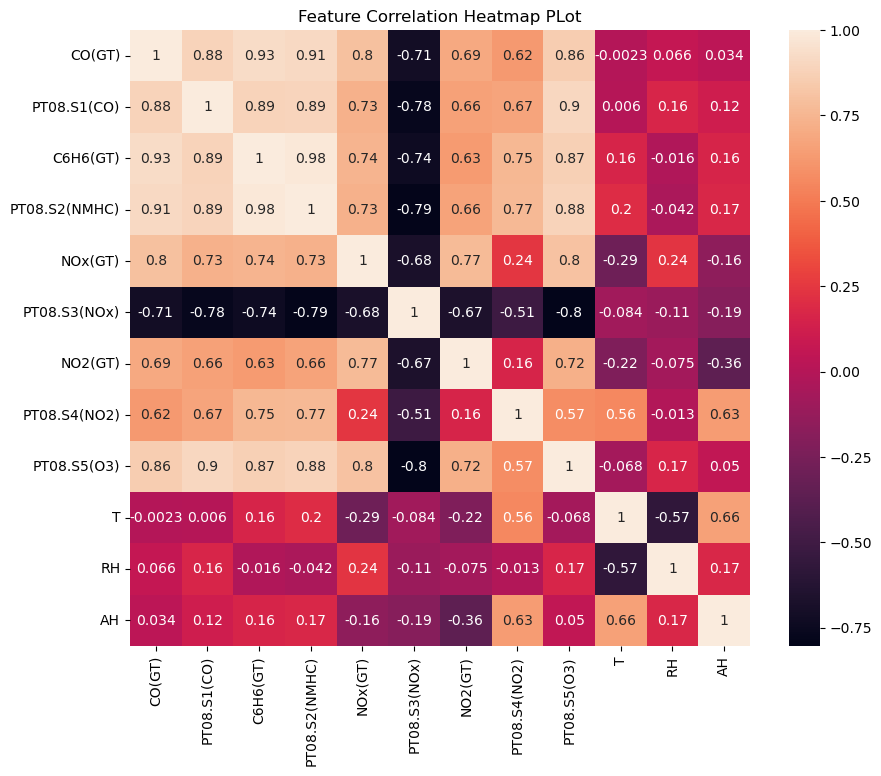

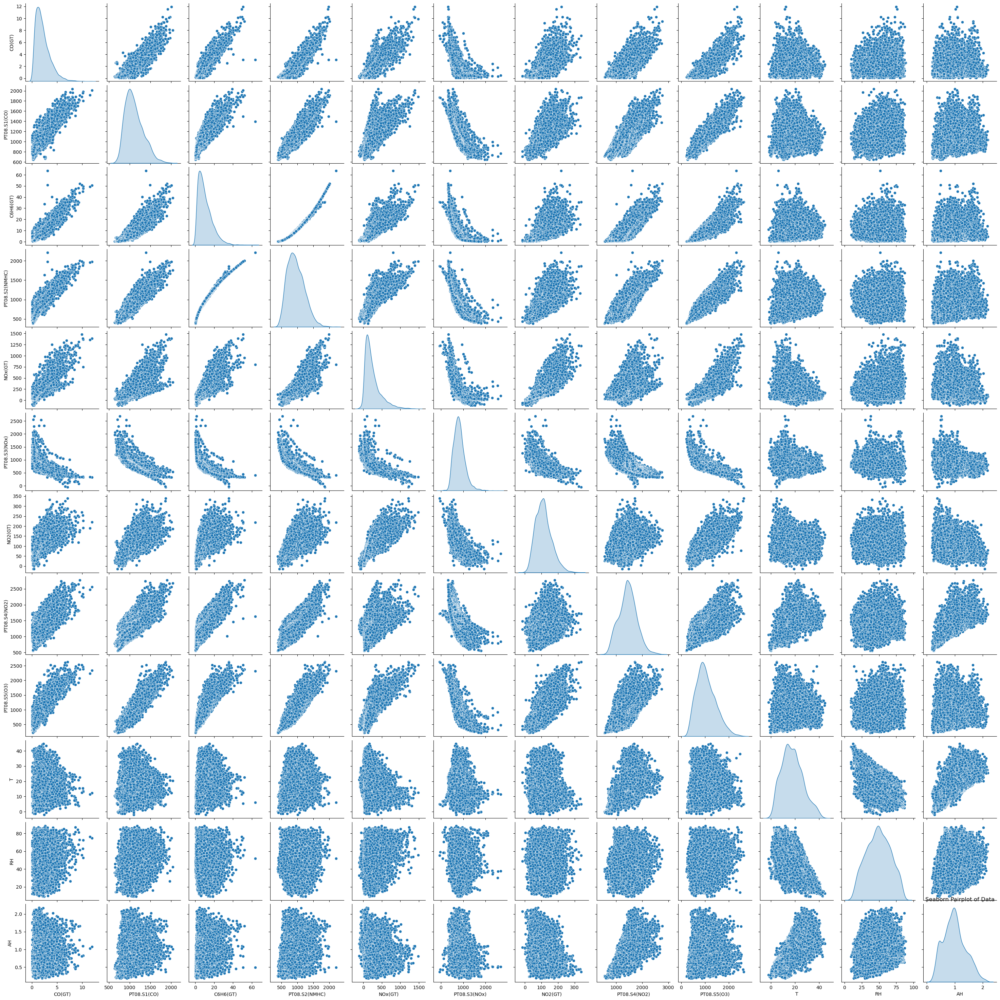

In [4]:
# B
plt.figure(figsize=(10,8))
sns.heatmap(data=df_q1_imputed.corr(), annot=True)
plt.title("Feature Correlation Heatmap PLot")

sns.pairplot(data=df_q1_imputed, diag_kind="kde")
plt.title("Seaborn Pairplot of Data")

# compute VIF
for i in range(X_imputed.shape[1]):
    print(variance_inflation_factor(X_imputed.values, i))

The correlation heatmap shows strong multicollinearity (>0.7) between many sensor variables such as PT08.S2(NMHC), C6H6(GT), PT08.S1(CO) and PT08.S5(O3) are presented with correlation factors >0.8. In the real world this makes sense, since all these sensors share common traffic, environmental conditions and chemical interplay
The relationship between these sensors can also be visually noticed and confirmed through the pairsplot where scattered points form a line linearly decreasing/increasing form, where low correlated features have scatters presented as a cluster of points, as seen with RH and PT08.S1(CO) for example. In addition, features with similar distributions are also highly correlated, as they are seen strongly right-skewed, hence increase during same environmental conditions. This indicates that sensors respond similarly to air quality changes. The target’s distribution is also right-skewed, similar to PT08.S2(NMHC), C6H6(GT), PT08.S1(CO), NOx(GT) and PT08.S5(O3), justified by high correlation factors on the heatmap, with the highest being C6H6(GT), hence will allow model to better learn the target. 

The Variance Inflation Factor (VIF) was also computed to measure how features are distorted due to high collinearity with other features. Values per feature ranged from 19 to 462, much greater than 5, hence the explanatory features are highly collinear with the other explanatory features. This inflated variance is due to the presence of multicollinearity between features. 


# Part 1 C)

In [5]:
# C
#wrksheet 1 Professor Andrew Duncan

X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42) 
X_train_with_const = sm.add_constant(X_train)
X_test_with_const = sm.add_constant(X_test)
OLS_model = sm.OLS(y_train, X_train_with_const).fit()
OLS_model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 CO(GT)   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     5276.
Date:                Wed, 26 Nov 2025   Prob (F-statistic):               0.00
Time:                        15:26:39   Log-Likelihood:                -3805.2
No. Observations:                6139   AIC:                             7634.
Df Residuals:                    6127   BIC:                             7715.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.0761      0.142     -7.561      0.000      -1.355      -0.797
PT08.S1(CO)       0.0013   7.73e-05     17.372      0.000       0.001       0.001
C6H6(GT)          0.1123      0.005     21.952      0.000       0.102       0.122
PT08.S2(NMHC)    -0.0002      0.000     -1.192      0.233      -0.001       0.000
NOx(GT)           0.0016   7.65e-05     20.255      0.000       0.001       0.002
PT08.S3(NOx)      0.0002    5.1e-05      3.564      0.000    8.18e-05       0.000
NO2(GT)           0.0022      0.000      8.451      0.000       0.002       0.003
PT08.S4(NO2)      0.0007   7.08e-05      9.696      0.000       0.001       0.001
PT08.S5(O3)      -0.0004   4.26e-05     -8.312      0.000      -0.000      -0.000
T                -0.0207      0.003     -8.261      0.000      -0.026      -0.016
RH               -0.0049      0.001     -5.025      0.000      -0.007      -0.003
AH               -0.0352      0.048     -0.734      0.463      -0.129       0.059
==============================================================================
Omnibus:                     1610.135   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            55882.031
Skew:                          -0.573   Prob(JB):                         0.00
Kurtosis:                      17.736   Cond. No.                     6.24e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.24e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

After fitting the model, we get an R-squared of 0.89 which is not bad. Based on the OLS model summary, most features are significant given they have a small p-value hence contributes to predicting the target. Significant features such as PT08.S1(CO), C6H6(GT), NOx(GT), PT08.S3(NOx), NO2(GT), PT08.S4(NO2), T, PT08.S5(O3) and RH. 

Features with large coefficients such as C6H6(GT) tend to have small p values even though we’ve seen before it correlates really well with the target, meaning they are significant, where small changes from their behalf strongly impact the prediction of the target. The reason behind having large coefficients or large p values is due to the effect of multicollinearity, leading to unstable coefficients and model unable to determine which feature exactly explains the variation. The presence of multicollinearity is supported by the correlation matrix and VIF values computed earlier. Given we are using OLS, it is unreliable with the presence or multicollinearity and requires regularization to control coefficients. 


# Part 1 D)

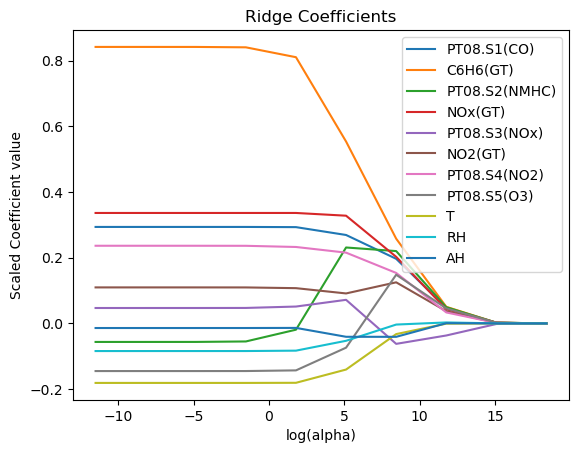

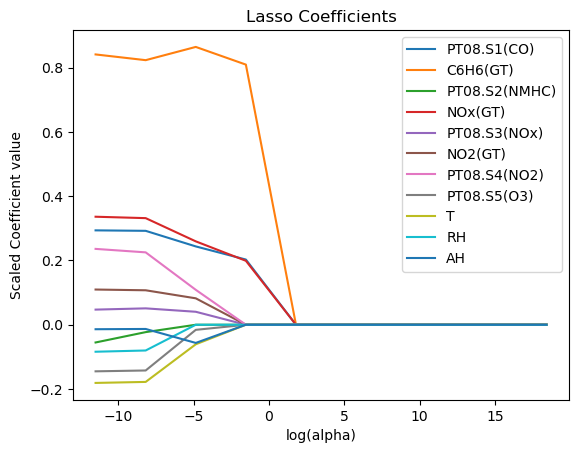

In [6]:
# D
#scale data so that coefficients shrink consistently
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Cross-validated Ridge and Lasso models
ridge_cv_model = RidgeCV(alphas=np.logspace(-6, 8, 15), cv=5).fit(X_train_scaled, y_train) # 5 K-fold 
lasso_cv_model = LassoCV(alphas=np.logspace(-6, 8, 15), cv=5).fit(X_train_scaled, y_train)

# Best alpha values
best_ridge_alpha = ridge_cv_model.alpha_
best_lasso_alpha = lasso_cv_model.alpha_

ridge_coefs = []
lasso_coefs = []

for a in np.logspace(-5, 8, 10):
    ridge = Ridge(alpha=a, fit_intercept=True, max_iter=5000) # without the mean the model is forced through the orgin, creating bias
    ridge.fit(X_train_scaled, y_train)
    ridge_coefs.append(ridge.coef_)

    lasso = Lasso(alpha=a, fit_intercept=True, max_iter=5000)
    lasso.fit(X_train_scaled, y_train)
    lasso_coefs.append(lasso.coef_)

ridge_coefs = np.array(ridge_coefs)
lasso_coefs = np.array(lasso_coefs)

plt.plot(np.log(np.logspace(-5, 8, 10)), ridge_coefs, label=X_train.columns)
plt.xlabel("log(alpha)")
plt.ylabel("Scaled Coefficient value")
plt.title("Ridge Coefficients")
plt.legend()
plt.show()

plt.plot(np.log(np.logspace(-5, 8, 10)), lasso_coefs, label=X_train.columns)
plt.xlabel("log(alpha)")
plt.ylabel("Scaled Coefficient value")
plt.title("Lasso Coefficients")
plt.legend()
plt.show()



As seen, using Ridge regression, all coefficients are brought close to zero, stabilizing the coefficients in the case of highly correlated features. It is also seen that correlated features as seen from before such as PT08.S1(CO), C6H6(GT) and NOx(GT) are seen shrinking together smoothly, which is expected given their multicollinearity. This can also be seen with PT08.S2(NMHC) and NO2(GT) where given their high correlation (0.88), they appear to shrink at the same rate, both suffering from coefficient swapping (sign flipping) due to severe multicollinearity. Can be seen capturing more explanatory power, then regularized by Ridge. 

Similarly, Lasso converges coefficients faster, also coefficients are capable of converging exactly to zero, hence capable of selecting one feature from each correlated group, making the model more interpretable. By doing so, the model is capable of only keeping the important predictors.  Picking one variable from each correlated group reduces the number of features, making interpretation of model clearer. Opposite to Ridge who’s constraint is circular (allowing it to overshoot then converge), Lasso has a diamond shaped constraint, where the corners force coefficients to hit exactly zero way earlier with smaller alphas and not overshoot as seen.


# Part 1 E)

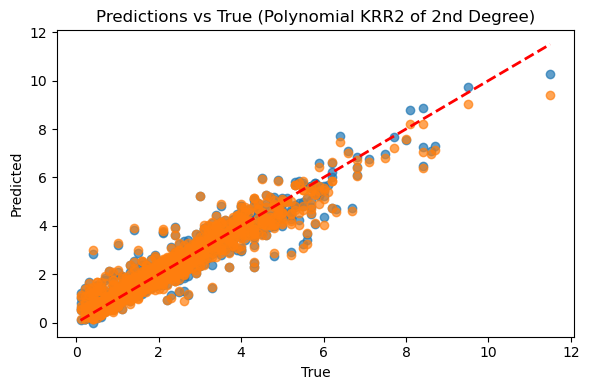

In [7]:
# E

def evaluate_krr(kernel, param_grid):

    # set up the pipeline
    pipe = Pipeline([
        ("krr", KernelRidge(kernel=kernel))
    ])

    #5 split CV
    cv = KFold(n_splits=5, shuffle=True, random_state=0)
    
    # merge grid into proper param names
    grid = {"krr__alpha": param_grid.get("alpha", [1.0])}
    for k, v in param_grid.items():
        if k != "alpha":
            grid[f"krr__{k}"] = v

    # Now run the grid search
    g = GridSearchCV(
        pipe, param_grid=grid, cv=cv,
        scoring="neg_root_mean_squared_error", n_jobs=None
    )
    # Run it
    g.fit(X_train_scaled, y_train)

    # Get the best model
    best = g.best_estimator_

    return best

poly_2 = evaluate_krr("polynomial", {"alpha":np.logspace(-3, 2, 5), "degree":[2], "coef0":[1]})

#Predict values to then compute scores

ytr_krr2 = poly_2.predict(X_train_scaled)
yte_krr2 = poly_2.predict(X_test_scaled)

yte_lasso = lasso_cv_model.predict(X_test_scaled)

plt.figure(figsize=(6,4))
plt.scatter(y_test, yte_krr2, alpha=0.7, label="Predicted CO(GT) using KRR Poly 2")
plt.scatter(y_test, yte_lasso, alpha=0.7, label="Predicted CO(GT) using L1")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], "r--", lw=2, label="Perfect Model")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.title("Predictions vs True (Polynomial KRR2 of 2nd Degree)")
plt.tight_layout()
plt.show()


The Poly scatter plot in blue is seen closer to the perfect line in red than the scattered Lasso model in orange, meaning achieves less error. In addition, I higher R^2 by 0.8% and lower RMSE by -0.02 confirms that. This is because Polynomial KRR adds nonlinear interactions that the linear models (OLS, Ridge and LASSO) cannot capture. However, the improvement is small but real. In addition Polynomial KRR combines flexibility with reduced overfitting given Ridge Regression, hence improving test RMSE.

# Part 1 F)

In [8]:
#F
rbf = evaluate_krr("rbf", {"alpha":np.logspace(-3, 2, 5), "gamma":np.logspace(-3,2,5)})


# Part 1 G)


=== Model Comparison Table ===
               In_R2    Out_R2    In_MAE   Out_MAE   In_RMSE  Out_RMSE
OLS         0.904502  0.909809  0.279645  0.280512  0.449734  0.433423
Ridge       0.904470  0.909574  0.279956  0.281118  0.449809  0.433989
Lasso       0.904446  0.909832  0.279456  0.280261  0.449864  0.433369
Poly-2 KRR  0.917293  0.917953  0.262640  0.264024  0.418531  0.413392
RBF KRR     0.934446  0.929065  0.234076  0.246035  0.372612  0.384381


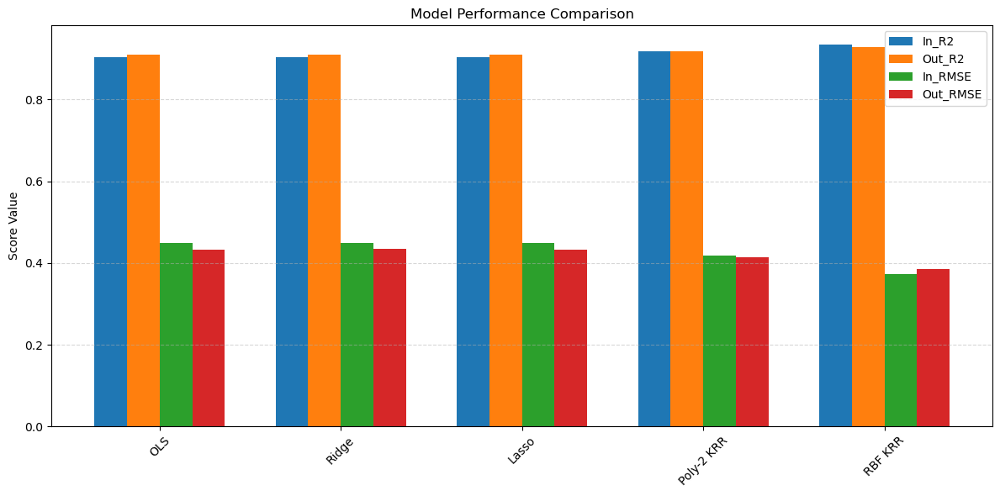

In [9]:
#G
#OLS Model
ytr_OLS = OLS_model.predict(X_train_with_const)
yte_OLS = OLS_model.predict(X_test_with_const)

#In-sample

In_r2_score_OLS = r2_score(y_train, ytr_OLS)
In_MAE_score_OLS = mean_absolute_error(y_train, ytr_OLS)
In_RMSE_score_OLS = root_mean_squared_error(y_train, ytr_OLS)

#Out-of-sample
Out_r2_score_OLS = r2_score(y_test, yte_OLS)
Out_MAE_score_OLS = mean_absolute_error(y_test, yte_OLS)
Out_RMSE_score_OLS = root_mean_squared_error(y_test, yte_OLS)

#Ridge Model
ytr_Ridge = ridge_cv_model.predict(X_train_scaled)
yte_Ridge = ridge_cv_model.predict(X_test_scaled)
#In-sample
In_r2_score_ridge = r2_score(y_train, ytr_Ridge)
In_MAE_score_ridge = mean_absolute_error(y_train, ytr_Ridge)
In_RMSE_score_ridge = root_mean_squared_error(y_train, ytr_Ridge)
#Out-of-sample
Out_r2_score_ridge = r2_score(y_test, yte_Ridge)
Out_MAE_score_ridge = mean_absolute_error(y_test, yte_Ridge)
Out_RMSE_score_ridge = root_mean_squared_error(y_test, yte_Ridge)

#LASSO Model

ytr_Lasso = lasso_cv_model.predict(X_train_scaled)
yte_Lasso = lasso_cv_model.predict(X_test_scaled)
#In-sample
In_r2_score_lasso = r2_score(y_train, ytr_Lasso)
In_MAE_score_lasso = mean_absolute_error(y_train, ytr_Lasso)
In_RMSE_score_lasso = root_mean_squared_error(y_train, ytr_Lasso)
#Out-of-sample
Out_r2_score_lasso = r2_score(y_test, yte_Lasso)
Out_MAE_score_lasso = mean_absolute_error(y_test, yte_Lasso)
Out_RMSE_score_lasso = root_mean_squared_error(y_test, yte_Lasso)

#Poly 2 KRR Model

ytr_krr2 = poly_2.predict(X_train_scaled)
yte_krr2 = poly_2.predict(X_test_scaled)
#In-sample
In_r2_score_PolyKRR2 = r2_score(y_train, ytr_krr2)
In_MAE_score_PolyKRR2 = mean_absolute_error(y_train, ytr_krr2)
In_RMSE_score_PolyKRR2 = root_mean_squared_error(y_train, ytr_krr2)
#Out-of-sample
Out_r2_score_PolyKRR2 = r2_score(y_test, yte_krr2)
Out_MAE_score_PolyKRR2 = mean_absolute_error(y_test, yte_krr2)
Out_RMSE_score_PolyKRR2 = root_mean_squared_error(y_test, yte_krr2)

#RBF KRR Model
ytr_RBF = rbf.predict(X_train_scaled)
yte_RBF = rbf.predict(X_test_scaled)
#In-sample
In_r2_score_rbf = r2_score(y_train, ytr_RBF)
In_MAE_score_rbf = mean_absolute_error(y_train, ytr_RBF)
In_RMSE_score_rbf = root_mean_squared_error(y_train, ytr_RBF)
#Out-of-sample
Out_r2_score_rbf = r2_score(y_test, yte_RBF)
Out_MAE_score_rbf = mean_absolute_error(y_test, yte_RBF)
Out_RMSE_score_rbf = root_mean_squared_error(y_test, yte_RBF)

# Build results table
results = {
    "OLS": {
        "In_R2": In_r2_score_OLS,
        "Out_R2": Out_r2_score_OLS,
        "In_MAE": In_MAE_score_OLS,
        "Out_MAE": Out_MAE_score_OLS,
        "In_RMSE": In_RMSE_score_OLS,
        "Out_RMSE": Out_RMSE_score_OLS
    },
    "Ridge": {
        "In_R2": In_r2_score_ridge,
        "Out_R2": Out_r2_score_ridge,
        "In_MAE": In_MAE_score_ridge,
        "Out_MAE": Out_MAE_score_ridge,  
        "In_RMSE": In_RMSE_score_ridge,
        "Out_RMSE": Out_RMSE_score_ridge
    },
    "Lasso": {
        "In_R2": In_r2_score_lasso,
        "Out_R2": Out_r2_score_lasso,
        "In_MAE": In_MAE_score_lasso,
        "Out_MAE": Out_MAE_score_lasso,
        "In_RMSE": In_RMSE_score_lasso,
        "Out_RMSE": Out_RMSE_score_lasso
    },
    "Poly-2 KRR": {
        "In_R2": In_r2_score_PolyKRR2,
        "Out_R2": Out_r2_score_PolyKRR2,
        "In_MAE": In_MAE_score_PolyKRR2,
        "Out_MAE": Out_MAE_score_PolyKRR2,
        "In_RMSE": In_RMSE_score_PolyKRR2,
        "Out_RMSE": Out_RMSE_score_PolyKRR2
    },
    "RBF KRR": {
        "In_R2": In_r2_score_rbf,
        "Out_R2": Out_r2_score_rbf,
        "In_MAE": In_MAE_score_rbf,
        "Out_MAE": Out_MAE_score_rbf,
        "In_RMSE": In_RMSE_score_rbf,
        "Out_RMSE": Out_RMSE_score_rbf
    },
}

df_q1_results = pd.DataFrame(results).T
print("\n=== Model Comparison Table ===")
print(df_q1_results)

# Display a bar chart for better visualization
# Convert results dict → DataFrame
df_results = pd.DataFrame(results).T

# Select metrics to plot
metrics = ["In_R2", "Out_R2", "In_RMSE", "Out_RMSE"]

# Create bar chart
plt.figure(figsize=(12, 6))
x = np.arange(len(df_results))  # model positions
width = 0.18                    # bar width

for i, metric in enumerate(metrics):
    plt.bar(x + i*width, df_results[metric], width, label=metric)

# Formatting
plt.xticks(x + width*1.5, df_results.index, rotation=45)
plt.ylabel("Score Value")
plt.title("Model Performance Comparison")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Kernel Ridge Rgression with Polynomial at 2nd order or RBF kernels significantly enhance the model's performance, by reducing the RMSE from 0.43 to 0.38 out of sample, and increases model predictivity with R2 score going from 0.90 to 0.93. However, this comes with the cost of losing model interpretability. This is because KRR works in a high-dimensional feature space using kernel similarity functions instead of learning coefficients of sensors. Hence, predictions depend on weighted similarities to all training samples rather than meaningful sensor coefficients, interpretability of individual feature effects or interactions much harder.

OLS model:

    Pros:
    - Magnitude and sign of each coefficient is directly interpretable, informing whether sensor affects model or not.
    - Simple and transparent

    Cons:
    - Worse predictivity compared to KRR models
    - Very sensitive to the presence of multicollinearity between sensors
    - Does not allow feature selection (much needed given multicollinearity)

Ridge model:

    Pros:
    - Smoothly shrinks coefficients by penalizing large ones, hence rerducing variance caused by multicollinearity
    - Still interpretable given coefficients are retained

    Cons:
    - Uses alls sensors even if redundant
    - Really small difference of performance improvement from OLS
    - A bit less interpretable than OLS given introduction of biased coefficients from shrinkage.

LASSO model:

    Pros:
    - Capable of feature selection by bringing redundant or highly correlated features' coefficients to zero.
    - Given feature selection, it is capable of identifying the most important sensors.
    - Capable of optimizing system.

    Cons:
    - Cannot capture nonlinear relationships.
    - When given highly correlated features, selects one arbitrarily, hence unstable. 
    -  Really small difference of performance improvement from OLS

Polynomial 2nd Degree KRR:

    Pros:
    - Capable of capturing nonlinear relationships between sensors.
    - Significantly enhanced accuracy and generalization compared to linear models (OLS, Ridge and LASSO).

    Cons:
    - Model is now not interpretable since coefficients are now transformed polynomial features.
    - More computationally expensive than linear models. 

RBF KRR:

    Pros:
    - Capable of capturing complex nonlinear relationships better than polynomial kernel as it is not limited to degree forms, capable of adapting locally. 
    - Best fitting model overall given smoothness and flexibility.
    - Highest in predictive power.

    Cons:
    - Performance depends on selection of hyperparameters alpha and gamma.
    - Completely not interpretable, not able to explain which sensors are relevant and which are redundant. 
    
    
        

# Part 1 H)

LASSO Model Path Summary

alpha = 0.000001
Selected features: ['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
Total cost: £10700
5-fold CV RMSE: 0.4514
..................................................
alpha = 0.000002
Selected features: ['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
Total cost: £10700
5-fold CV RMSE: 0.4514
..................................................
alpha = 0.000003
Selected features: ['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
Total cost: £10700
5-fold CV RMSE: 0.4514
..................................................
alpha = 0.000004
Selected features: ['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
Total cost: £10700
5-fold C

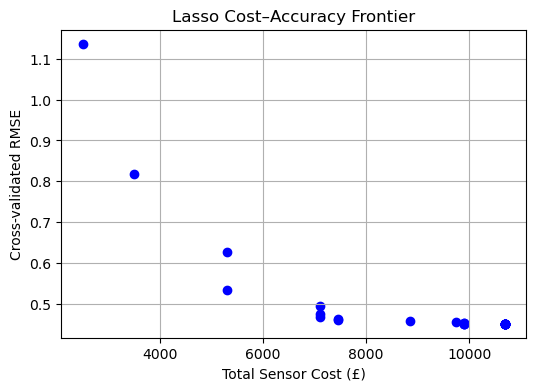

alpha              1.0
features    [C6H6(GT)]
cost              2500
cv_rmse       1.136793
Name: 29, dtype: object
alpha                      0.621017
features    [PT08.S1(CO), C6H6(GT)]
cost                           3500
cv_rmse                    0.817582
Name: 28, dtype: object
Low cost model's test RMSE is: 1.130634143332096
High cost model's test RMSE is: 0.8119348104067117


In [27]:
#H
reg_alphas = np.logspace(-6, 0, 30)  # Creates 100 points from 10^-4 to 10^2, tuning the regularization parameter
feature_names = X_train.columns.tolist()
results = []
sensor_costs = {
    "PT08.S1(CO)": 1000,
    "PT08.S2(NMHC)": 800,
    "PT08.S3(NOx)": 700,
    "PT08.S4(NO2)": 700,
    "PT08.S5(O3)": 900,
    "T": 150,
    "RH": 150,
    "AH": 200,
    "NOx(GT)": 1800,
    "NO2(GT)": 1800,
    "C6H6(GT)": 2500
}

for i, a in enumerate(reg_alphas):

    # Fit Lasso model for THIS alpha
    lasso_i = Lasso(alpha=a, fit_intercept=True, max_iter=5000)
    lasso_i.fit(X_train_scaled, y_train)

    coef_vector = lasso_i.coef_

    # Selected Features
    selected_features = [
        feature_names[j] for j in range(len(coef_vector))
        if abs(coef_vector[j]) > 1e-6
    ]

    # Total Cost
    total_cost = sum(sensor_costs[f] for f in selected_features)

    # Correct 5-fold CV RMSE
    # https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html
    neg_rmse_scores = cross_val_score(lasso_i, X_train_scaled, y_train, scoring='neg_root_mean_squared_error', cv=5)
    cv_rmse = np.mean(-neg_rmse_scores)

    # Store Results
    results.append({
        "alpha": a,
        "features": selected_features,
        "cost": total_cost,
        "cv_rmse": cv_rmse
    })

print("LASSO Model Path Summary\n")
for r in results:
    print(f"alpha = {r['alpha']:.6f}")
    print("Selected features:", r["features"])
    print(f"Total cost: £{r['cost']}")
    print(f"5-fold CV RMSE: {r['cv_rmse']:.4f}")
    print("." * 50)

df_path = pd.DataFrame(results)

plt.figure(figsize=(6,4))
plt.scatter(df_path["cost"], df_path["cv_rmse"], c="blue")

plt.xlabel("Total Sensor Cost £")
plt.ylabel("Cross-validated RMSE")
plt.title("Lasso Cost vs Accuracy")
plt.grid(True)
plt.show()

# get the best low cost design by filtering through cost and RMSE, picking the lowest rmse
low_cost_design = df_path[df_path["cost"] <= 2500].sort_values("cv_rmse").iloc[0]
print(low_cost_design)

# get the best high cost design by filtering through cost and RMSE, picking the lowest rmse
high_perf_design = df_path[df_path["cost"] <= 4000].sort_values("cv_rmse").iloc[0]
print(high_perf_design)

#best alpha parameter in both high performance and low cost
alpha_low = low_cost_design["alpha"]
alpha_high = high_perf_design["alpha"]

#Lasso fitted model for low cost and high cost
lasso_low = Lasso(alpha=alpha_low, max_iter=5000).fit(X_train_scaled, y_train)
lasso_high = Lasso(alpha=alpha_high, max_iter=5000).fit(X_train_scaled, y_train)

#predicted values using low and high cost designs
yte_low = lasso_low.predict(X_test_scaled)
yte_high = lasso_high.predict(X_test_scaled)

#RMSE of low and high design after predictions
test_rmse_low = root_mean_squared_error(y_test, yte_low)
test_rmse_high = root_mean_squared_error(y_test, yte_high)

print(f"Low cost model's test RMSE is: {test_rmse_low}")
print(f"High performance model's test RMSE is: {test_rmse_high}")

As seen in the plot, there is a clear exponential decrease in RMSE as the total design cost increases. This implies that every additional sensor improves predictive accuracy. However, the amount of improvement shrinks as cost increases, hence at some point it is better to stay with lower cost with a slightly higher or same RMSE. 

It is clearly seen that returns start to diminish beyond £8000. Going from £2500 to £3500, RMSE reduces by about 0.3 which is a big improvement. However, going from £9750 to £10700, RMSE imrpoved by about 0.02, which is really small. Hence, we can conclude that the last expensive sensor only provide marginal improvement. 

Having different designs, analyzing using cost and predictive performance, we chose low cost monitor (≤ £2500) and high performance monitor (≤ £4000). The best low cost design is chosen based on RMSE score and same for high performance. The best low cost monitor at £2500 with a C6H6(GT) sensore presents a test RMSE of 1.13 which is poor. However, just by adding one sensor going to a high performance monitor by incorporating PT08.S1(CO) and C6H6(GT) at a cost of £3500, we get a test RMSE of 0.81, which is a significant enhancement and worth the £1000 price difference, making it very cost effective. We can conclude that the optimal budget is between £3000 to £6000, where the accuracy improves the most. All in all, added sensors up to £6000 remain justified, beyond that the returns start to diminish sharply. 

# Part 1 I)

Best Low-cost threshold: 2.8205128205128203 Cost: 248000
Best High-performance threshold: 3.333333333333333 Cost: 224000


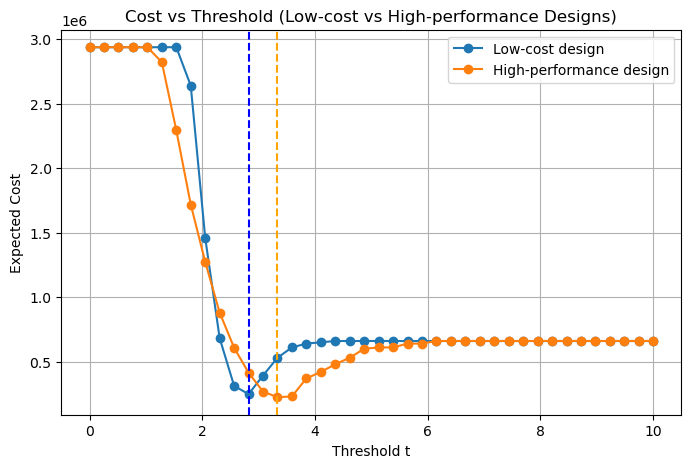

In [34]:
#Use two chosen feature sets
features_low = low_cost_design["features"] #C6H6(GT)
features_high = high_perf_design["features"] #PT08.S1(CO) and C6H6(GT)

# Extract columns
# extracting only the columns that correspond to the selected feature in low cost and high performance models
low_idx = []
high_idx = []
for f in features_low:
    low_idx.append(feature_names.index(f))
for f in features_high:
    high_idx.append(feature_names.index(f))

X_train_low = X_train_scaled[:, low_idx]
X_test_low  = X_test_scaled[:, low_idx]

X_train_high = X_train_scaled[:, high_idx]
X_test_high  = X_test_scaled[:, high_idx]

# Fit simple LASSO on each subset
lasso_low  = Lasso(alpha=low_cost_design["alpha"]).fit(X_train_low, y_train)
lasso_high = Lasso(alpha=high_perf_design["alpha"]).fit(X_train_high, y_train)

# Get predictions
y_pred_low  = lasso_low.predict(X_test_low)
y_pred_high = lasso_high.predict(X_test_high)

# Cost function across thresholds
legal_thresh = 5
C_FP = 2000
C_FN = 10000

thresholds = np.linspace(0, 10, 40)

def compute_cost_curve(y_pred):
    costs = []
    for t in thresholds:
        alert_pred = (y_pred > t).astype(int)
        alert_true = (y_test > legal_thresh).astype(int)

        FP = ((alert_pred == 1) & (alert_true == 0)).sum()
        FN = ((alert_pred == 0) & (alert_true == 1)).sum()

        cost = C_FP*FP + C_FN*FN
        costs.append(cost)
    return np.array(costs)


costs_low  = compute_cost_curve(y_pred_low)
costs_high = compute_cost_curve(y_pred_high)

best_t_low  = thresholds[np.argmin(costs_low)]
best_t_high = thresholds[np.argmin(costs_high)]

print("Best Low-cost threshold:", best_t_low, "Cost:", costs_low.min())
print("Best High-performance threshold:", best_t_high, "Cost:", costs_high.min())


# Plot both curves for low cost and high performance designs

plt.figure(figsize=(8,5))
plt.plot(thresholds, costs_low,  label="Low-cost design", marker="o")
plt.plot(thresholds, costs_high, label="High-performance design", marker="o")

plt.axvline(best_t_low,  color="blue", linestyle="--")
plt.axvline(best_t_high, color="orange", linestyle="--")

plt.xlabel("Threshold t")
plt.ylabel("Expected Cost")
plt.title("Cost vs Threshold (Low-cost vs High-performance Designs)")
plt.legend()
plt.grid(True)
plt.show()


Using the best low cost and high performance models, we determine whether an unecessary alert was flaged or the system missed a dangerous pollution. The model tries its best to minimize the cost by balancing between the threshold that leads to unecessary alerts or missed dangers. After looping through a range of thresholds to predict the state, we conclude that the most optimal threshold resulting in minimized costs is at t = 2.8 for the low cost model and t = 3.3 for the high performance design.  

As seen in the plot, for very low thresholds (0-1), we get many False Positives where the model assumes anything is an alert. This inceases the costs the most (3M) as in the context of pollution level detection, we are presented with less actual dangerous alerts than normal states, hence flagging mostly anything as an alert increases the cost a lot. As the threshold is increased, we start to see a significant drop in the total cost as False Positives decrease. 

As we start to increase t, the cost increases as we encounter more False Negatives. This is because with a high threshold, model starts to pass dangerous levels of CO(GT), where the legal limit is 5. However, even though missing a true dangerous pollution event is extremely dangerous and expensive (£10000) when compared to FP (£2000), the data in general does not contain a lot of dangerous levels of pollution, so by passing mostly anything as normal level misses any true dangerous levels hence cost is saturated to the amount of actual dangerous pollution levels in the dataset as seen in the plot. 

# Part 1 J)


The low cost design with sensor C6H6(GT) costing £2500 achieves an expected minimum cost of £248000 at a threshold of t=2.82 when compared to the high performance design with sensors C6H6(GT) and PT08.S1(CO), costing of £3500, achieving an expected minimum cost of £224000 at a threshold t=3.3. As observed at the plot, the high performance design achieves lower expected costs across nearly the entire threshold range of 0-10. Th high performance model brings the expected cost down by £24000. This reduction in expected cost is due to introducing more sensors hence better generalization, and encountering fewer False Negatives which are really expensive, and slightly fewer False Positives which are more frequent. 

For the reasons listed above, adding an extra sensor is worth it as the extra cost in sensor adoption is returned with less False Positives and Negatives, reducing the expected cost of wrongly flagging alerts. Therefore, eventhough the High Performance design costs £1000 more, the expected reduction in operational costs due is £24000, which is an excellent trade-off given it is 24 x the cost of added hardware. Not only does adding an extra sensor PT08.S1(CO) to have a high performance monitor reduce expected costs compared to low cost design, but it increases predictivity given a reduced RMSE and fewer missed dangerous pollution levels given a slightly higher optimal threshold that increases system stability when predicting. 


# Part 2

# Part 2 A )

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import (accuracy_score, confusion_matrix, ConfusionMatrixDisplay,
                             roc_auc_score, roc_curve, precision_recall_curve,
                             average_precision_score, RocCurveDisplay, PrecisionRecallDisplay)
from sklearn.decomposition import PCA
from sklearn.calibration import calibration_curve
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.utils import resample 
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC, LinearSVC
import warnings
warnings.filterwarnings("ignore")

target
0    0.5
1    0.5
Name: proportion, dtype: float64


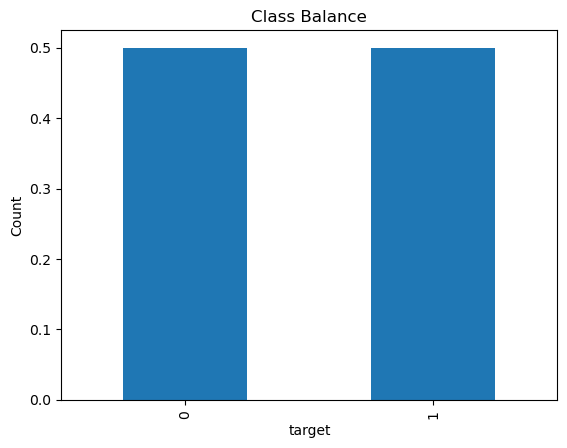

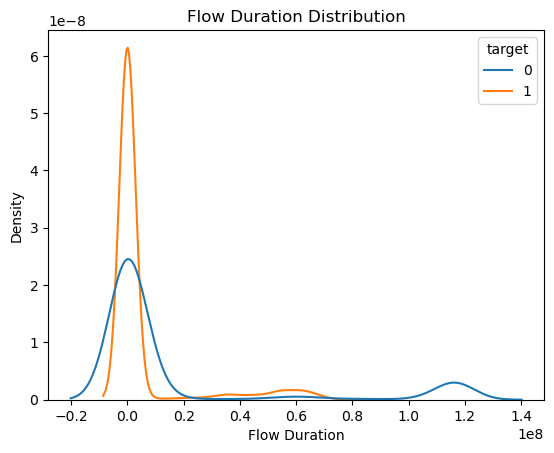

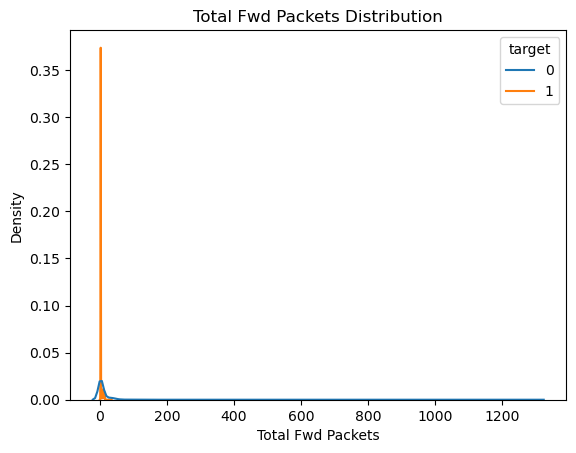

In [3]:
df = pd.read_csv("q2.csv")   # path to your file

df.head()

# Class balance
counts = df['target'].value_counts(normalize=True)
print(counts)   # class balance

counts.plot.bar(title="Class Balance")
plt.ylabel("Count"); plt.show()

# Features and target
X = df.drop(columns=['target'])
y = df['target']

# Identify column types
num_cols = X.columns.tolist()
num_cols.remove('Protocol')
cat_cols = ['Protocol']

# Train / test split (80/20, stratified)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# For a pairs plot, let's sample a subset of features for clarity
features = df.columns.drop('target')
plt.title('Flow Duration Distribution')
sns.kdeplot(df, x="Flow Duration", hue="target")
plt.show()

plt.title('Total Fwd Packets Distribution')
sns.kdeplot(df, x="Total Fwd Packets", hue="target")
plt.show()

Looking at the distribution plots, we can see that Flow Duration seperates both classes at both ends of the distribution. The malicious class with target=1 is seen to have a narrow peak where the two distributions overlap near zero, but then diverge strongly. Malicious class (1) flows are very concentrated at small durations, implying that attacks tend to have very small durations with an extremely narrow peak. However, benign class (0) flows are more spread out du to having many very long outliers which cause this long tail which is seen around 1.2 1e8. The large right tail indicates that any long lasting flows are most likely benign, which gives a good class seperation of Flow Duration. Therefore the useful discriminative information within Flow duration allows to distinguish between benign in the case of wide range of durations and malicious in the case of unusually short durations. 

Now the distribution for Total Forwrad Packets again shows concentration around 0-20 Total Forward Packets, however, the malicious flow (1) shows a sharp narrow spike with low packet counts when compared to the benign flows (0) that displays more spread out with more packet counts when compared to malicious flows. However, very small forward packet counts appear in both classes causing strong overlap, but any higher forward packet counts are exclusively benign, allowing for class separation. 

Therefore we can say that for the malicious flows class, the tall narrow spike that is very close to zero, attack flows (1) tend to involve a very small number of forward packets with almost no variation as seen in the plot within that spike, while benign flows tend to have a longer right tail with more pockets where there is no malicious flows.  

# Part 2 B)

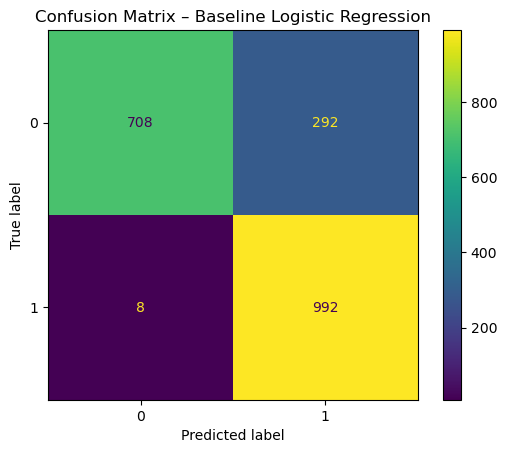

Accuracy: 0.85


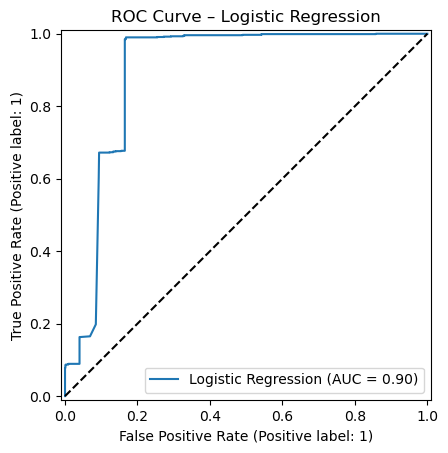

ROC-AUC: 0.8952760000000001


In [4]:
# B
# apply column transform for preprocessing

#convert feature matrix X into a python list to differentiate between categories and numerical features for preprocessing
numeric_cols = X.columns.tolist()
# remove Protocol from the list to be scaled as it is categorical hence will be OneHotEncoded
numeric_cols.remove('Protocol')
categorical_cols = ['Protocol']

preprocess = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_cols), # scale only numeric columns
        ("cat", OneHotEncoder(drop='first'), categorical_cols) # one hot encode only categorical columns (Protocol)
        # drop first to avoid dummy variable trap, where dropped category (0) becomes the baseline
    ]
)

logistic_reg = Pipeline(steps=[
    ("preprocess", preprocess),
    ("model", LogisticRegression(max_iter=1000))
])

logistic_reg.fit(X_train, y_train)

# Predicted probabilities for ROC
y_proba = logistic_reg.predict_proba(X_test)[:, 1]

# Default threshold = 0.5
y_pred = (y_proba > 0.5).astype(int)

# create a confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion Matrix – Baseline Logistic Regression")
plt.show()

logistic_acc = accuracy_score(y_test, y_pred)
print("Accuracy:", logistic_acc)

RocCurveDisplay.from_predictions(
    y_test,
    y_proba,
    name="Logistic Regression"
)
plt.plot([0, 1], [0, 1], '--', color='black')
plt.title("ROC Curve – Logistic Regression")
plt.show()

roc_auc = roc_auc_score(y_test, y_proba)
print("ROC-AUC:", roc_auc)


Using a default threshold of t=0.5, the proportion of correctly classified flows is computed using the accuracy score. With an accuracy score of 0.85, the model correctly classifies whether a cyber attack occured or not 85% of the time. However, this score does not highlight the different costs of False Negatives and False Positives. 

Looking at the confusion matrix, the model falls short with False Positives (292 FP) when compared to False Negatives (8 FN only). However, this is better since the model prioritizes not missing False Negatives which might lead bigger consequences. False Negatives in the context of cyber security dangerous so maintaining a low number as seen (8) is good. When comparing to False Positives, they are less dangerous but just waste analyst time. 

To evaluate the True Positive rate, a ROC curve is plotted above. As a baseline, it can be seen that the curve lies significantly above the random model, with the curve closer to the top left corner, indicating better discrimination. This strongly shows how the model independently of thresholds priotizes malicious flows above benign ones. The ROC-AUC then sums up this ROC curve in just one number. With a AUC score of 0.90, it's on the higher side closer to 1, hence model is really well capable of distinguishing from benign and malicious events effectively. In addition, the AUC score is independent of threshold, therefore is more relaible in cost sensitive scenarios or class imbalanced data.

# Part 2 C)

Accuracy L1: 0.9125
ROC-AUC L1: 0.9327425
Accuracy Logostic L1: 0.9125


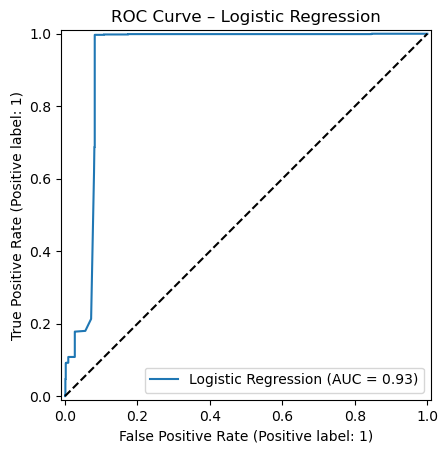

ROC-AUC: 0.8952760000000001


In [5]:
# C
# logistic regression with an L1 penalty on the coefficients.
logistic_reg_l1 = Pipeline(steps=[
    ("preprocess", preprocess),
    ("model", LogisticRegression(penalty='l1', solver='liblinear', max_iter=5000))
])

logistic_reg_l1.fit(X_train, y_train)

y_proba_l1 = logistic_reg_l1.predict_proba(X_test)[:, 1]
y_pred_l1 = logistic_reg_l1.predict(X_test)
y_score_l1 = logistic_reg_l1.predict_proba(X_test)[:, 1]

print("Accuracy L1:", accuracy_score(y_test, y_pred_l1))
print("ROC-AUC L1:", roc_auc_score(y_test, y_score_l1))

acc = accuracy_score(y_test, y_pred_l1)
print("Accuracy Logostic L1:", acc)

RocCurveDisplay.from_predictions(
    y_test,
    y_proba_l1,
    name="Logistic Regression"
)
plt.plot([0, 1], [0, 1], '--', color='black')
plt.title("ROC Curve – Logistic Regression")
plt.show()


roc_auc_l1 = roc_auc_score(y_test, y_proba)

print("ROC-AUC:", roc_auc_l1)


In [6]:

# Preprocess training and test data
X_train_processed = preprocess.fit_transform(X_train)
X_test_processed  = preprocess.transform(X_test)

# After preprocessing, build the list of feature names
# retrieve one hot encoder
one_hot_enc = preprocess.named_transformers_['cat']
# get the names of new columns produced by one hot encoder
categorical_feature_names = one_hot_enc.get_feature_names_out(categorical_cols)

print(categorical_feature_names)

feature_names = np.array(numeric_cols + list(categorical_feature_names))
print("Total features:", len(feature_names))

['Protocol_6' 'Protocol_17']
Total features: 14


In [7]:
# evaluate selection stability with bootstrap
N_bootstrap = 20
N_features = feature_names
# array where each position corresponds to the index of the feature
# count the number of feature repeatedly selected
selected_feature_counts = np.zeros(len(N_features))

N_samples = X_train_processed.shape[0]

for N in range(N_bootstrap):
    # Sample indices with replacement
    # create a vector of N sample indices with replacement within the range of number of samples in the original dataset
    idx = np.random.choice(N_samples, size=N_samples, replace=True)
    X_bootstrap = X_train_processed[idx]
    y_bootstrap = y_train.iloc[idx]

    # Fit L1 logistic regression
    Bootstrap_model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=5000)
    Bootstrap_model.fit(X_bootstrap, y_bootstrap)

    # Record which coefficients are non-zero
    coefs_bootstrap = Bootstrap_model.coef_[0]
    selected_feature_counts += (coefs_bootstrap != 0) # if this is true adds 1 to where the index stands true, hence for the 20 bootstrap sampling

In [8]:

selected_feature_freq = selected_feature_counts / 20

freq_df = pd.DataFrame({"feature": feature_names, "selected_feature_freq": selected_feature_freq}).sort_values("selected_feature_freq", ascending=False)
print(freq_df)
print(selected_feature_counts)

                        feature  selected_feature_freq
0                 Flow Duration                   1.00
1             Total Fwd Packets                   1.00
2        Total Backward Packets                   1.00
5                 Flow IAT Mean                   1.00
12                   Protocol_6                   1.00
8             Packet Length Std                   1.00
13                  Protocol_17                   1.00
10                  Active Mean                   1.00
11                    Idle Mean                   1.00
9           Average Packet Size                   0.95
6                  Flow IAT Std                   0.80
7            Packet Length Mean                   0.75
3   Total Length of Fwd Packets                   0.40
4   Total Length of Bwd Packets                   0.25
[20. 20. 20.  8.  5. 20. 16. 15. 20. 19. 20. 20. 20. 20.]


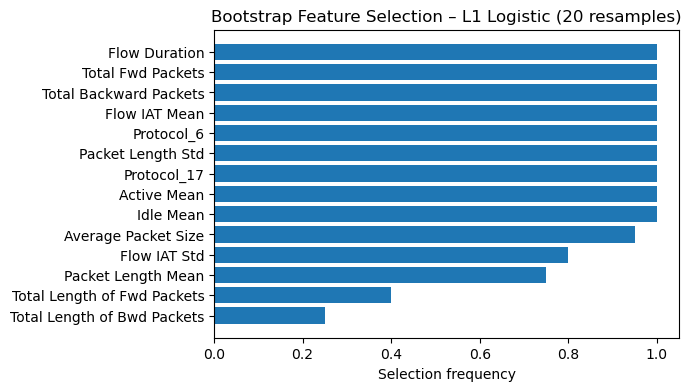

In [9]:
plt.figure(figsize=(6,4))
plt.barh(freq_df["feature"], freq_df["selected_feature_freq"])
plt.gca().invert_yaxis()
plt.xlabel("Selection frequency")
plt.title("Bootstrap Feature Selection – L1 Logistic (20 resamples)")
plt.show()

                        feature        coef    abs_coef
8             Packet Length Std -122.893948  122.893948
13                  Protocol_17  -70.029848   70.029848
12                   Protocol_6   24.620392   24.620392
9           Average Packet Size   16.541780   16.541780
7            Packet Length Mean   16.234972   16.234972
1             Total Fwd Packets   14.906742   14.906742
2        Total Backward Packets   -9.702241    9.702241
0                 Flow Duration   -1.524433    1.524433
11                    Idle Mean    0.976681    0.976681
10                  Active Mean   -0.824308    0.824308
5                 Flow IAT Mean    0.544797    0.544797
6                  Flow IAT Std   -0.492911    0.492911
4   Total Length of Bwd Packets    0.000000    0.000000
3   Total Length of Fwd Packets    0.000000    0.000000


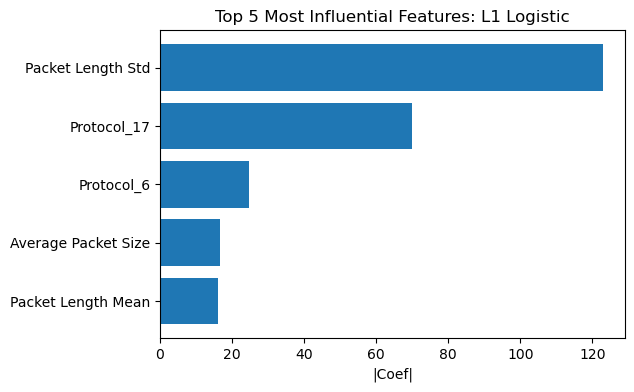

Top 5 most influential features:
                feature        coef    abs_coef
8     Packet Length Std -122.893948  122.893948
13          Protocol_17  -70.029848   70.029848
12           Protocol_6   24.620392   24.620392
9   Average Packet Size   16.541780   16.541780
7    Packet Length Mean   16.234972   16.234972


In [10]:
logistic_l1_eval = LogisticRegression(penalty='l1', solver='liblinear',max_iter=5000)
logistic_l1_eval.fit(X_train_processed, y_train)

coefs_l1 = logistic_l1_eval.coef_[0]

coef_df = pd.DataFrame({"feature": feature_names, "coef": coefs_l1, "abs_coef": np.abs(coefs_l1)}).sort_values("abs_coef", ascending=False)

print(coef_df)
top_5_coefs = coef_df.head(5)

plt.figure(figsize=(6,4))
plt.barh(top_5_coefs["feature"], top_5_coefs["abs_coef"])
plt.gca().invert_yaxis()
plt.xlabel("|Coef|")
plt.title("Top 5 Most Influential Features: L1 Logistic")
plt.show()

print('Top 5 most influential features:')
print(top_5_coefs)

Looking at the top 5 most influencial coefficients with respect to their magnitude, we can see that the Packet Length Std (-122.7) and Protocol_17 (-69.9) features have ranked the two most influencial features. These two dominant coefficients are negative, which means they are associated with benign flows. We can deduce that benign flows tend to exhibit higher or more varied Packet Lengths given that it has the most dominant negative coefficient, discriminating between malicious and benign flows. Contrary to Average Packet Size (16.84), which it's uniformity shows attack flows. Comparing Protocol 17 and 6, Protocol 17 UDP traffic is more associated with benign flows, where Protocol 6 TCP traffic. However, the other 2 most influencial features (Average Packet Size and Packet Length Mean) have positive coefficients, positively contributing in detecting malicious flows. We can conclude that malicious attacks are uniform and predictable in packet sizes, and benign flows have mixed and varied packet sizes. 

# Part 2 D)

Best soft-margin C: 10
Soft-margin accuracy: 0.8375
Soft-margin ROC-AUC: 0.8726895000000001


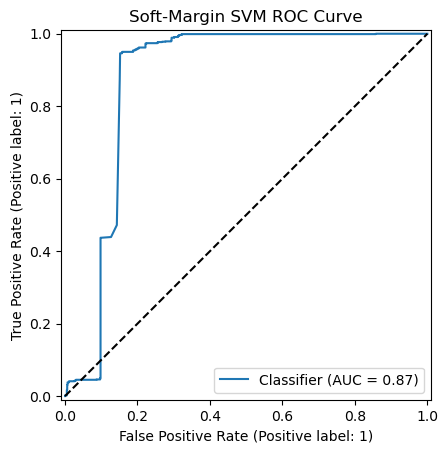

Soft-margin support vectors: 2897
Soft-margin support vectors per class [0, 1]: [1443 1454]


In [12]:
# D
# soft margin with grid search CV
pipe_svc = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="linear", max_iter=100000, probability=False, random_state=0))
])

param_grid = {
    "svc__C": [0.1, 1, 10, 100]   # soft-margin candidates
}

grid = GridSearchCV(
    pipe_svc,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy"
)

grid.fit(X_train, y_train)

best_soft = grid.best_estimator_
best_C = grid.best_params_["svc__C"]

print("Best soft-margin C:", best_C)

# Evaluate soft-margin model
y_pred_soft = best_soft.predict(X_test)
soft_acc = accuracy_score(y_test, y_pred_soft)

# decision_function gives continuous scores for ROC-AUC
# distance to decision boundary/hyperplane for each sample
soft_distance = best_soft.decision_function(X_test)
soft_roc_auc = roc_auc_score(y_test, soft_distance)

print("Soft-margin accuracy:", soft_acc)
print("Soft-margin ROC-AUC:", soft_roc_auc)
RocCurveDisplay.from_predictions(y_test, soft_distance)
plt.plot([0, 1], [0, 1], '--', color='black')
plt.title("Soft-Margin SVM ROC Curve")
plt.show()

# Number of support vectors
soft_svm_model = best_soft.named_steps["svc"]
print("Soft-margin support vectors:", soft_svm_model.support_vectors_.shape[0])
print("Soft-margin support vectors per class [0, 1]:", soft_svm_model.n_support_)


Hard-margin accuracy: 0.4995
Hard-margin ROC-AUC: 0.5928215


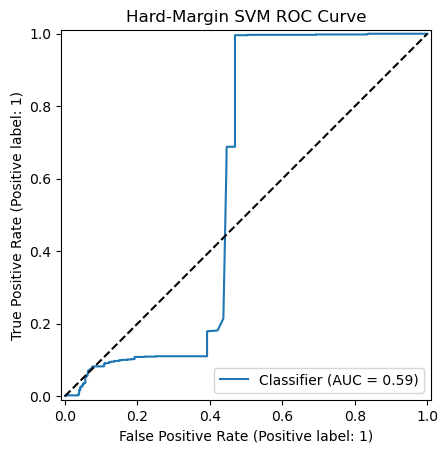

Hard-margin #support vectors: 231
Hard-margin support vectors per class: [ 78 153]


In [13]:
svc_hard = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="linear", C=1e6, max_iter=200000, probability=False, random_state=0))
])

svc_hard.fit(X_train, y_train)

# Hard-margin accuracy
y_pred_hard = svc_hard.predict(X_test)
hard_acc = accuracy_score(y_test, y_pred_hard)

# ROC-AUC
hard_distance = svc_hard.decision_function(X_test)
hard_roc_auc = roc_auc_score(y_test, hard_distance)

print("\nHard-margin accuracy:", hard_acc)
print("Hard-margin ROC-AUC:", hard_roc_auc)
RocCurveDisplay.from_predictions(y_test, hard_distance)
plt.plot([0, 1], [0, 1], '--', color='black')
plt.title("Hard-Margin SVM ROC Curve")
plt.show()

# Hard-margin support vectors
hard_svm_model = svc_hard.named_steps["svc"]
print("Hard-margin #support vectors:", hard_svm_model.support_vectors_.shape[0])
print("Hard-margin support vectors per class:", hard_svm_model.n_support_)

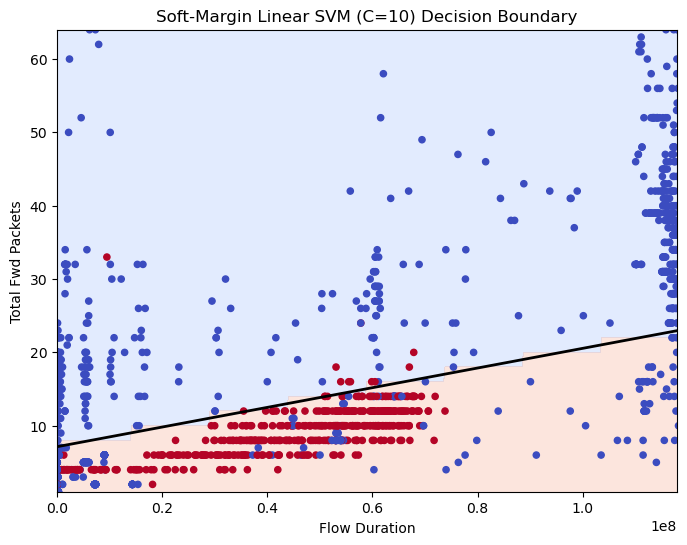

In [19]:
feature_1 = "Flow Duration"
feature_2 = "Total Fwd Packets"

X2_train = X_train[[feature_1, feature_2]].copy()
y_train_2d = y_train.copy()

svm_2d = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="linear", C=best_C, probability=False, random_state=0))
])

svm_2d.fit(X2_train, y_train_2d)


# Build a grid over the scaled 2D space
x_min, x_max = X2_train[feature_1].min(), X2_train[feature_1].max()
y_min, y_max = X2_train[feature_2].min(), X2_train[feature_2].max()

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 500),
    np.linspace(y_min, y_max, 500)
)

# Flatten the grid for prediction
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Scale grid
grid_scaled = svm_2d.named_steps["scaler"].transform(grid_points)

# Decision values
Z = svm_2d.named_steps["svc"].decision_function(grid_scaled)
Z = Z.reshape(xx.shape)


plt.figure(figsize=(8,6))

plt.contourf(xx, yy, Z > 0, alpha=0.25, cmap="coolwarm")

# Decision boundary line
plt.contour(xx, yy, Z, levels=[0], colors="black", linewidths=2)

# Scatter the original unscaled training data
plt.scatter(
    X2_train[feature_1],
    X2_train[feature_2],
    c=y_train_2d,
    cmap="coolwarm",
    s=20
)

plt.title("Soft-Margin Linear SVM (C=10) Decision Boundary")
plt.xlabel(feature_1)
plt.ylabel(feature_2)

plt.xlim(X2_train[feature_1].quantile(0.01), X2_train[feature_1].quantile(0.99))
plt.ylim(X2_train[feature_2].quantile(0.01), X2_train[feature_2].quantile(0.99))

plt.show()

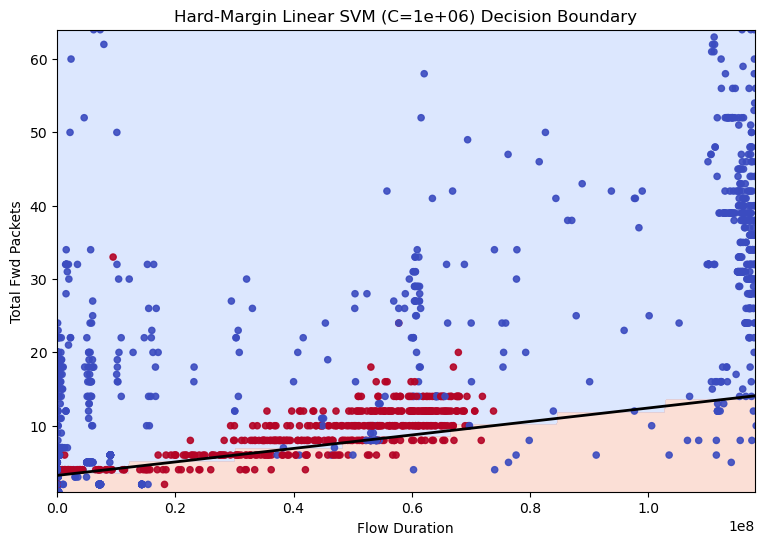

In [33]:
feat1 = "Flow Duration"
feat2 = "Total Fwd Packets"

X2_train = X_train[[feat1, feat2]].copy()
y2_train = y_train.copy()

# fit hard margin on svm scaled
hardC = 1e6

svm_hard = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="linear", C=hardC, probability=False, random_state=0))
])

svm_hard.fit(X2_train, y2_train)

# build meshgrid in original space
x_min, x_max = X2_train[feat1].min(), X2_train[feat1].max()
y_min, y_max = X2_train[feat2].min(), X2_train[feat2].max()

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 600),
    np.linspace(y_min, y_max, 600)
)

grid_original = np.c_[xx.ravel(), yy.ravel()]

# scale grid
grid_scaled = svm_hard.named_steps["scaler"].transform(grid_original)

# Decision function
Z = svm_hard.named_steps["svc"].decision_function(grid_scaled)
Z = Z.reshape(xx.shape)

# plot unscaled
plt.figure(figsize=(9,6))

# Background
plt.contourf(xx, yy, Z > 0, alpha=0.3, cmap="coolwarm")

# Decision boundary line
plt.contour(xx, yy, Z, levels=[0], colors="black", linewidths=2)

# Scatter ORIGINAL data
plt.scatter(
    X2_train[feat1], X2_train[feat2],
    c=y2_train, cmap="coolwarm", s=20, alpha=0.9
)

plt.title(f"Hard-Margin Linear SVM (C={hardC:.0e}) Decision Boundary")
plt.xlabel(feat1)
plt.ylabel(feat2)


plt.xlim(X2_train[feat1].quantile(0.01), X2_train[feat1].quantile(0.99))
plt.ylim(X2_train[feat2].quantile(0.01), X2_train[feat2].quantile(0.99))

plt.show()






The hard margin SVM assumes training data is perfecty linearly separable and does not allow for missclassification. In the given context of network traffic data for cyber security, benign and malicious flows overlap strongly due to noise (outliers) and mislabeled data. As stated, since hard margin does not allow missclassifications, it is affected strongly by outliers, where a single outlier forces the margin to narrow sharply, resulting in overfitting to the training data and an unstable classifier. On ther other hand, soft margin SVMs allow violations of the margin constraint to an extent, therefore producing a smoother and generalized boundary that performs better to unseen network traffic data.

# Part 2 E)

Best rbf C: 100
Best rbf gamma: 10
RBF SVM Test Accuracy: 0.961
RBF SVM Test ROC-AUC: 0.9671795000000001


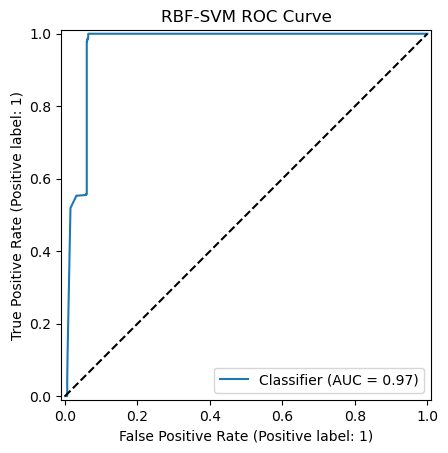

In [34]:
# E
# pipeline for the rbf svc
pipe_rbf_svc = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(kernel="rbf", max_iter=100000, probability=False, random_state=0))
])

param_grid_rbf = {"svc__C": [0.1, 1, 10, 100], "svc__gamma": [0.001, 0.1, 1, 10]}

grid_rbf = GridSearchCV(pipe_rbf_svc, param_grid=param_grid_rbf, cv=5, scoring="accuracy")

grid_rbf.fit(X_train, y_train)

best_rbf = grid_rbf.best_estimator_
best_C = grid_rbf.best_params_["svc__C"]
best_gamma = grid_rbf.best_params_["svc__gamma"]

print("Best rbf C:", best_C)
print("Best rbf gamma:", best_gamma)

y_pred_rbf = best_rbf.predict(X_test)
rbf_acc = accuracy_score(y_test, y_pred_rbf)

rbf_scores = best_rbf.decision_function(X_test)
rbf_roc_auc = roc_auc_score(y_test, rbf_scores)

print("RBF SVM Test Accuracy:", rbf_acc)
print("RBF SVM Test ROC-AUC:", rbf_roc_auc)
# ROC curve
RocCurveDisplay.from_predictions(y_test, rbf_scores)
plt.plot([0, 1], [0, 1], '--', color='black')
plt.title("RBF-SVM ROC Curve")
plt.show()


In [35]:
results_rbf_logistic = {
    "Model": [
        "Logistic Regression",
        "Logistic Regression (L1)",
        "RBF SVM"
    ],
    "Accuracy": [
        logistic_acc,
        acc,
        rbf_acc
    ],
    "ROC-AUC": [
        roc_auc,
        roc_auc_l1,
        rbf_roc_auc
    ]
}

df_results_rbf_logistic = pd.DataFrame(results_rbf_logistic)
print(df_results_rbf_logistic)

                      Model  Accuracy   ROC-AUC
0       Logistic Regression    0.8500  0.895276
1  Logistic Regression (L1)    0.9125  0.895276
2                   RBF SVM    0.9610  0.967180


Looking at the results in the table above, we can see that RBF SVM performs way better than Logistic Regression with and without L1. RBF achieves the best accuracy score of 96% and a ROC-AUC score of 0.97. This is the case because RBF is able to model nonlinear decision boundaries hence can adapt to complex patterns of network traffic data. Logistic regression performs well but is linear, hence cannot capture the nonlinear relationships between features. In addition, the imrpovement from Logistic Rgression to L1 Logistic Regression highlights how some features are better being removed and only a subset of features are really important, hence sparsity can help. All in all, nonlinear models such as RBF SVM are more robust in distinguishing between malicious and benign flows.

# Part 2 F)


Logistic
Cost at default threshold 0.5: £8,292,000
Optimal threshold (0–1): 0.0000
Minimum achievable cost: £1,000,000

Logistic L1
Cost at default threshold 0.5: £1,174,000
Optimal threshold (0–1): 0.0000
Minimum achievable cost: £1,000,000

SVM Soft
Cost at default threshold 0.5: £924,000
Optimal threshold (0–1): 0.7258
Minimum achievable cost: £858,000

SVM Hard
Cost at default threshold 0.5: £999,000
Optimal threshold (0–1): 0.8997
Minimum achievable cost: £852,000

RBF SVM
Cost at default threshold 0.5: £995,000
Optimal threshold (0–1): 0.8896
Minimum achievable cost: £136,000


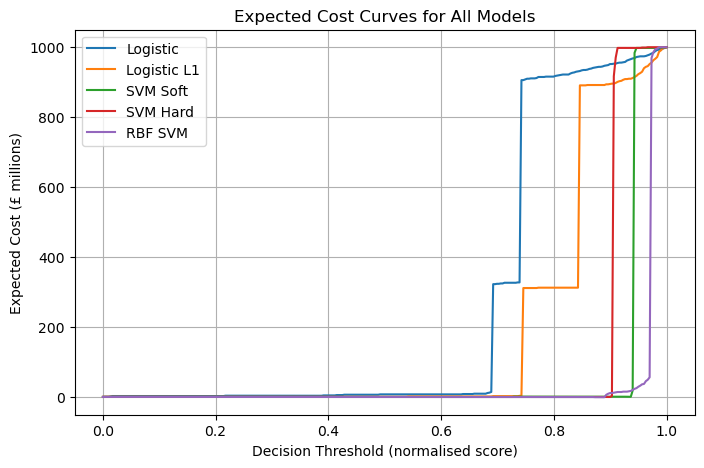

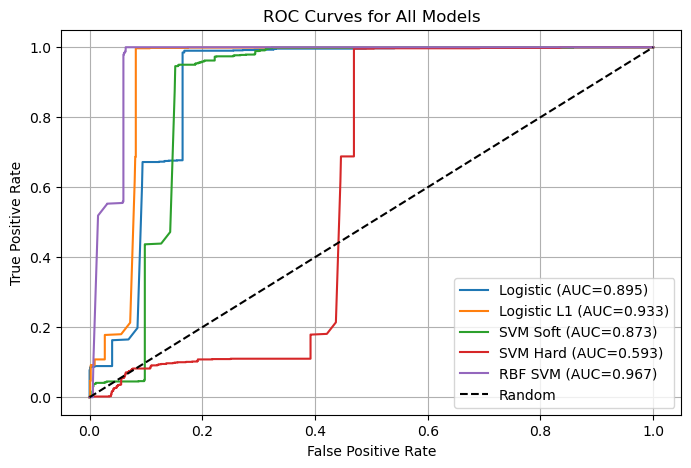



Summary Table

            Default Threshold Default Cost (£) Optimal Threshold (0–1)  \
Logistic                  0.5        8,292,000                     0.0   
Logistic L1               0.5        1,174,000                     0.0   
SVM Soft                  0.5          924,000                  0.7258   
SVM Hard                  0.5          999,000                  0.8997   
RBF SVM                   0.5          995,000                  0.8896   

            Min Cost (£) ROC-AUC  
Logistic       1,000,000  0.8953  
Logistic L1    1,000,000  0.9327  
SVM Soft         858,000  0.8727  
SVM Hard         852,000  0.5928  
RBF SVM          136,000  0.9672  


In [45]:
# F

CFN = 1_000_000    # cost of a false negative
CFP = 1_000        # cost of a false positive

N_pos = np.sum(y_test == 1)
N_neg = np.sum(y_test == 0)

def get_raw_scores(model, X):
    """
    Return a continuous score for class 1:
    - use predict_proba if available
    - otherwise use decision_function
    """
    if hasattr(model, "predict_proba"):
        return model.predict_proba(X)[:, 1]
    elif hasattr(model, "decision_function"):
        return model.decision_function(X)
    else:
        raise ValueError("Model has neither predict_proba nor decision_function.")


# cost curve computation
def compute_cost_curve(model, X_test, y_test):
    """
    - Get raw scores for the test set.
    - Normalise scores to [0,1].
    - Sweep thresholds in [0,1] and compute expected cost:
         cost(t) = CFN * FN(t) + CFP * FP(t)
      which is equivalent to the formula in the handout.
    - Also compute ROC curve from raw scores.
    """

    # raw scores (can be logits / margins / probabilities)
    raw_scores = get_raw_scores(model, X_test)

    # normalise to [0,1] for thresholding
    s_min, s_max = raw_scores.min(), raw_scores.max()
    scores_norm = (raw_scores - s_min) / (s_max - s_min + 1e-12)

    thresholds = np.linspace(0, 1, 300)
    costs = []

    for t in thresholds:
        y_pred = (scores_norm >= t).astype(int)

        FP = np.sum((y_pred == 1) & (y_test == 0))
        FN = np.sum((y_pred == 0) & (y_test == 1))

        # This is algebraically equal to:
        # CFN * (1 - TPR(t)) * N_pos + CFP * FPR(t) * N_neg
        cost = CFN * FN + CFP * FP
        costs.append(cost)

    costs = np.array(costs)

    # ROC curve from raw (unnormalised) scores
    fpr, tpr, _ = roc_curve(y_test, raw_scores)
    roc_auc = roc_auc_score(y_test, raw_scores)

    return thresholds, costs, fpr, tpr, roc_auc


# models already trained

models = {
    "Logistic": logistic_reg,
    "Logistic L1": logistic_reg_l1,
    "SVM Soft": best_soft,
    "SVM Hard": svc_hard,
    "RBF SVM": best_rbf
}

# compute ROC and cost for all models
results = {}

for name, model in models.items():
    thresholds, costs, fpr, tpr, roc_auc = compute_cost_curve(model, X_test, y_test)

    # default threshold = 0.5 (in the normalised [0,1] score space)
    idx_default = np.argmin(np.abs(thresholds - 0.5))
    default_cost = costs[idx_default]

    # optimal threshold = argmin(cost)
    idx_opt = np.argmin(costs)
    opt_t = thresholds[idx_opt]
    opt_cost = costs[idx_opt]

    results[name] = {
        "thresholds": thresholds,
        "costs": costs,
        "default_cost": default_cost,
        "optimal_threshold": opt_t,
        "optimal_cost": opt_cost,
        "fpr": fpr,
        "tpr": tpr,
        "roc_auc": roc_auc
    }

    print(f"\n{name}")
    print(f"Cost at default threshold 0.5: £{default_cost:,.0f}")
    print(f"Optimal threshold (0–1): {opt_t:.4f}")
    print(f"Minimum achievable cost: £{opt_cost:,.0f}")


# cost curve plots
plt.figure(figsize=(8, 5))
for name, res in results.items():
    plt.plot(res["thresholds"], res["costs"] / 1e6, label=name)

plt.xlabel("Decision Threshold (normalised score)")
plt.ylabel("Expected Cost (£ millions)")
plt.title("Expected Cost Curves for All Models")
plt.grid(True)
plt.legend()
plt.show()


#combined roc curve plots
plt.figure(figsize=(8, 5))
for name, res in results.items():
    plt.plot(res["fpr"], res["tpr"], label=f"{name} (AUC={res['roc_auc']:.3f})")

plt.plot([0, 1], [0, 1], "k--", label="Random")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for All Models")
plt.grid(True)
plt.legend()
plt.show()


# table
summary = pd.DataFrame({
    model: {
        "Default Threshold": 0.5,
        "Default Cost (£)": f"{res['default_cost']:,.0f}",
        "Optimal Threshold (0–1)": round(res["optimal_threshold"], 4),
        "Min Cost (£)": f"{res['optimal_cost']:,.0f}",
        "ROC-AUC": round(res["roc_auc"], 4)
    }
    for model, res in results.items()
}).T

print("\n\nSummary Table\n")
print(summary)



The optimal operating point for all models occurs at a very low decision threshold (≈0.0). This stroingly avoids false negatives, since each FN costs £1M, while each FP costs only £1000. The RBF SVM achieves the lowest expected cost (136000) and the highest AUC (0.97), being the strongest separation between benign and malicious traffic.
Hard-margin SVM performs worst even though its cost ranks second place, its inflexible decision boundary produces many false negatives, giving it an extremely high expected cost and the worse ROC-AUC (0.59) out of all models. As seen, at default thresholds, very few positives are detected hence the costs are really high, missing many actual attacks and increasing false negatives. Given CFN is too high, only 8 FN can result in a cost of 8 million. This explains why some optimal thresholds are set to zero so that the model predicts everything as malicious, eliminating false negatives entirely, this is for the Logistic Rgression case. However, for other models, they are capable of detecting most FN hence there is no need to reduce the threshold to 0. When a model is confident, reducing the threshold will not necessarily reduce the cost.  

# Part 2 G)

Comparison of Models:

Interpretability-->
Logistic Regression and Penalised Lasso L1 Logistic Regression are the most interpretable models given linear relationships. Logistic provides stable coefficient estimates, while the Logistic using L1 penalty drives irrelevant weights to zero, hence performing feature selection, making model more transparent. When compared to other models such as Linear SVM, they offer less transparency even though the decision boundary is linear, the margin-based optimization makes individual feature effects less interpretable. RBF SVM is the least interpretable since predictions are based on the support vectors in a transformed feature space. This therefore makes decision making pattern less interpretable by users. 

Accuracy-->
Regarding accuracy, tests show that RBF SVM consistently achieved the highest accuracy and ROC-AUC (0.96), followed by soft-margin linear SVM and L1-regularised logistic regression (0.91–0.93). Standard logistic regression performed slightly worse (0.85–0.90). The hard-margin SVM was unstable and underperformed due to sensitivity to outliers as it was overfitting and very fragile hence strongly affected by noise, with the lowest accuracy (0.50) and ROC-AUC (0.59). All in all, RBF SVM showed the best performance on new unseen data, capable of capturing non-linear attack patterns.

Stability under Resampling-->
Logistic Regression Lasso (L1) and Linear SVM showed the highest stability with hard training data set. L1 improves robustness as it introduces a penalty that removes noisy features entirely by performing feature selection, only keeping the most important ones, making model more robust even when performing 20 bootstrap resampling. It was seen that selection followed a specific pattern. However, hard-margin SVM showed extreme instability, where outliers in the data caused large changes in the boundary due to its requirement for a perfectly separable class, not leaving room for misclassification hence overfits. For the RBF SVM, it remained stable but is affected by class imbalance as the kernel expands smaller patterns.

Robustness to Changing Costs-->
When cost sensitivity was introduced (CFN = £1M, CFP = £1k), optimal thresholds shifted downward, reflecting the models' attempt to avoid costly false negatives. Logistic and L1-Logistic both showed stable, smooth cost curves, with thresholds collapsing toward 0, indicating a consistent and conservative response to high FN penalties. Soft-margin SVM behaved similarly but required a higher optimal threshold (~0.73), reflecting its margin-based separation. Hard-margin SVM continued to perform poorly, retaining high costs due to its rigid boundary and inability to tolerate misclassification. RBF SVM remained the strongest model, reducing its expected cost from £995,000 to £136,000; the steep shape of its decision boundary explains the sharp transition in its cost curve. Future work should address noisy extremes in the feature space, as these outliers disproportionately affect the linear models and the hard-margin SVM.


Deployment Recommendation:
A recommended deployment strategy is to have a model that balances between predictive power and interpretability, allowing model transparency and good distinguishing between malicious and benign flows.

1- Baseline Monitoring Layer:
This model provides transparent coefficients that users can link to behavioral features, being more explainable. This will support model understanding in terms of functionality, anomaly interpretation and regulatory review. In addition, this is computationally low in cost, hence is perfect for constant monitoring. 

2- High-Sensitivity Layer
Incorporating another layer that uses RBF SVM when the baseline Logistic L1 flags with low confidence levels or strong malicious score. This will deliver higher detection power and will minimize false negatives hence cost as it is suitable for high impact decision with an accuracy of 96%. 

3- Fallback Layer: 
In the case where RBF SVM is computationally expensive, or when operational predictability is required, we could use a fallback layer that incorporates Linear SVM with soft-margin. This is because soft-margin linear svm provides a good balance between stability and accuracy, hence is reliable under varying data conditions. In addition, it generalizes better than the hard margin, hence avoiding misclassification and overfitting to outliers, reducing costs. 


Risks and Adaptation:
Feature distribution shift is a strong operational risk. This happens when cyber attackers change features such as packet timings and sizes to avoid detection. The most vulnerable models are Logistic and linear SVMs, since they rely on stable linear feature label relationships. RBF SVMs are more robust but fall short when malicious flows fall outside the learnt structure of training support vectors. However, this is managed by monitoring stats of each feature constantly, retraining recent network data every now and then as well as feature distribution shift detection such as KL-divergence. This will trigger whenever shifts occur. A multi-model monitoring framework where multiple models decide together if something is anomalous enhances the system’s robustness, capable of adapting well to malicious flows approaches.
